# Import Libraries

In [158]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.svm import SVR
from scipy.stats import norm
from scipy.stats import f_oneway
import os
from joblib import load, dump

In [159]:
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

# Function definitions

In [160]:
def scale_data(data):
    """
    Scales the data by normalizing it based on the training set's mean and standard deviation.

    Parameters:
    - data (pd.DataFrame): The dataset to be scaled.

    Returns:
    - pd.DataFrame: Scaled dataframe.
    """
    data_mean = data.mean()
    data_std = data.std()
    return (data - data_mean) / data_std

In [161]:
def unscale_data(data, scaled_data):
    """
    Reverses the process performed by scaling the data.

    Parameters:
    - data (pd.DataFrame): The dataset to be restored.

    Returns:
    - pd.DataFrame: Unscaled dataframe.
    """
    data_mean = data.mean()
    data_std = data.std()
    return scaled_data * data_std + data_mean

In [162]:
def create_lagged_features(df, N=7):
    # List to store the lagged dataframes
    lagged_dfs = [df]

    # Create dataframes with N lags per feature
    for n in range(1, N+1):
        lagged_df = df[df.columns[1:]].shift(n)
        lagged_df.columns = [f"{col}_lag{n}" for col in lagged_df.columns]
        lagged_dfs.append(lagged_df)

    # Concatenate the lagged dataframes
    df_lagged = pd.concat(lagged_dfs, axis=1)

    # Drop NaNs
    df_lagged = df_lagged.dropna().reset_index(drop=True)

    return df_lagged

In [163]:
def iterative_prediction(models, X, Y, M=7, N=7):
    # Initialize list to store predictions
    predictions = []

    # Predict for [0,N] days ahead iteratively
    for i in range(len(X)):
        current_data = X.iloc[i].copy()
        for m in range(M):
            # Extract features for prediction (only the lagged features)
            features = current_data.to_frame().T

            # Initialize directory to store predictions per feature
            predicted_values = {}

            # Make prediction for each variable
            for col, model in models.items():
                predicted_values[col] = model.predict(features)[0]

            # Update the lags
            for col in Y.columns[1:]:
                for n in range(N, 0, -1):
                    if n == 1:
                        current_data[f"{col}_lag{n}"] = predicted_values[col]
                    else:
                        current_data[f"{col}_lag{n}"] = current_data[f"{col}_lag{n-1}"]

            # Store the prediction
            predictions.append(predicted_values)

    data_predicted = pd.DataFrame(predictions)

    # Shift predictions to better visualize results
    data_predicted_shift = pd.DataFrame()
    for col in data_predicted.columns:
        for i in range(1, N+1):
            data_predicted_shift[f"{col}_ahead{i}"] = data_predicted[col].iloc[i - 1::7].reset_index(drop=True)

    return data_predicted_shift

In [164]:
def compute_error(data, data_predicted):
  error = pd.DataFrame()

  # Ignore the first seven rows of df1
  df1 = data.iloc[7:]
  
  # Reset index
  df1 = df1.reset_index(drop=True)
  df2 = data_predicted.reset_index(drop=True)

  # Loop over each set of seven columns in df2
  for i in range(0, len(df2.columns), 7):
      subset = df2.iloc[:, i:i+7]
      col_name = df1.columns[i // 7]
      diff = subset.subtract(df1[col_name].values, axis=0)
      error = pd.concat([error, diff], axis=1)

  return error

In [165]:
def calculate_residuals(df_actual, df_predicted):
    """
    Calculates the residuals for each corresponding column between actual and predicted DataFrames.

    Parameters:
    df_actual (DataFrame): DataFrame containing the actual values.
    df_predicted (DataFrame): DataFrame containing the predicted values.

    Returns:
    DataFrame: A DataFrame containing the residuals for each corresponding column.
    """
    # Initialize a dictionary to store residuals for each column
    residuals = {}

    # Loop through each column in the predicted DataFrame
    for col in df_predicted.columns:
        # Identify the corresponding actual value column
        actual_col = col.split('_ahead')[0]

        # Calculate residuals (predicted - actual)
        residuals[col] = df_predicted[col] - df_actual[actual_col]

    # Convert the residuals dictionary to a DataFrame for easy viewing
    df_residuals = pd.DataFrame(residuals)

    return df_residuals

In [166]:
def plot_error_density(error,features,feature_title,feature_unit,model,N=7,save=False):
    M = len(error.columns)
    num_plots = -(-M // N)


    for i in range(num_plots):
        if save:
            if not os.path.exists(f'results/N={N}/{model}/Error Density'):
                os.makedirs(f'results/N={N}/{model}/Error Density')
            
            filename = f'results/N={N}/{model}/Error Density/{model}_Error Density_{features[i]}_N={N}.svg'
        
        plt.figure(figsize=(8, 6))

        start = i * N
        end = min((i + 1) * N, M)
        for j, col in enumerate(error.columns[start:end]):
            sns.kdeplot(error[col], label=f"Day {j + 1}")

        plt.legend()
        plt.xlabel(f'{feature_title[min(i, len(feature_title) - 1)]} Predictive Error ({feature_unit[min(i, len(feature_title) - 1)]})')
        plt.tight_layout()
        if save:
            plt.savefig(filename, format='svg')
            print(f"Saved: {filename}")
        else:
            plt.show()

In [167]:
def anova_test(df1, df2, df3):
    for col in df1.columns:
        data1 = df1[col].dropna()
        data2 = df2[col].dropna()
        data3 = df3[col].dropna()
        f_statistic, p_value = f_oneway(data1, data2, data3)
        print(f"Variable: {col}")
        print(f"F-statistic: {f_statistic}")
        print(f"P-value: {p_value}")
        if p_value < 0.05:
            print("The means are significantly different.\n")
        else:
            print("The means are not significantly different.\n")

# Loading Dataset

In [168]:
# Load CSV
hourly = pd.read_csv("cache/Monterrey.csv")
# Format the date
hourly['Fecha'] =  pd.to_datetime(hourly['Fecha'], format='%m/%d/%y %H:%M')
# Drop unused weather variables
hourly = hourly.drop(columns=['DirRafaga', 'DirViento', 'RelHum', 'RapRafaga'])
# Set timestamp as index
hourly.set_index('Fecha', inplace=True)

In [169]:
# Resample the data to daily frequency
data = hourly.resample('D').agg({'Temp': ['mean', 'min', 'max'],
                                 'PresBarometr': ['mean'],
                                 'RadSolar': ['mean', 'max'],
                                 'RapViento': ['mean']})

# Flatten the column names
data.columns = [f'{col[0]}_{col[1]}' for col in data.columns]

# Reset the index
data.reset_index(inplace=True)

# Drop NaNs
data = data.dropna()

In [170]:
features = data.columns[1:].tolist()
features

['Temp_mean',
 'Temp_min',
 'Temp_max',
 'PresBarometr_mean',
 'RadSolar_mean',
 'RadSolar_max',
 'RapViento_mean']

In [171]:
# Titles for the features
feature_title = ["Average Temperature",
                 "Minimum Temperature",
                 "Maximum Temperature",
                 "Average Pressure",
                 "Average Solar Radiation",
                 "Maximum Solar Radiation",
                 "Average Wind Speed"]

# Units for the features
feature_unit = ["°C",
                "°C",
                "°C",
                "hPa",
                "W/m^2",
                "W/m^2",
                "m/s"]

# Feature Engineering

In [172]:
# Define size of predictive window
win_size = 15 # win_size lags | win_size predictions

In [173]:
# Splitting into train and test sets
test_size = 0.2
data_train = data[0:int(data.shape[0] * (1 - test_size))]
data_val = data[int(data.shape[0] * (1 - test_size)):]

In [174]:
# Create df with lagged features
data_lagged = create_lagged_features(data, N=win_size)
# Create df with lagged features for the training set
data_train_lagged = create_lagged_features(data_train, N=win_size)
# Create df with lagged features for the validation set
data_val_lagged = create_lagged_features(data_val, N=win_size)
data_val_lagged.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 868 entries, 0 to 867
Columns: 113 entries, Fecha to RapViento_mean_lag15
dtypes: datetime64[ns](1), float64(112)
memory usage: 766.4 KB


In [175]:
# Split the data into features and targets
X_train = data_train_lagged.filter(like='_lag') # Only lags are features
Y_train = data_train_lagged[data.columns[1:]] # Current weather variables are targets
X_val = data_val_lagged.filter(like='_lag')
Y_val = data_val_lagged[data.columns[1:]]

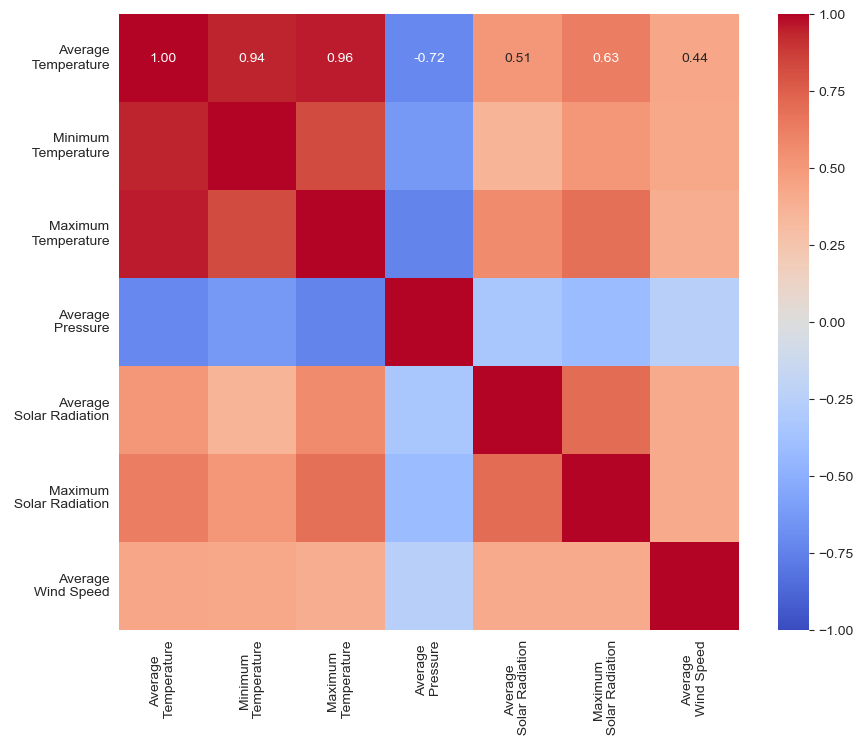

In [176]:
correlation_matrix = data.iloc[:, 1:].corr()
new_names = {
    "Temp_mean": "Average\n Temperature",
    "Temp_max": "Maximum\n Temperature",
    "Temp_min": "Minimum\n Temperature",
    "PresBarometr_mean": "Average\n Pressure",
    "RadSolar_mean": "Average\n Solar Radiation",
    "RadSolar_max": "Maximum\n Solar Radiation",
    "RapViento_mean": "Average\n Wind Speed",

}
correlation_matrix.rename(columns=new_names, index=new_names, inplace=True)

if not os.path.exists('results'):
    os.makedirs('results')
    
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap="coolwarm", vmin=-1, vmax=1)
plt.savefig('results/Correlation Matrix.svg', format='svg')


# RF Model

In [177]:
# Check if file for model exists; otherwise, train the model
rf_models_filename = f'cache/rf_models_N={win_size}.joblib' # Filename of the model

if os.path.exists(rf_models_filename):
    rf_models = load(rf_models_filename) # Load the model
    print("Model loaded from file.")
else:
    # Dictionary to store trained models for each weather variable
    rf_models = {}
    
    # Train models
    for col in Y_train.columns:
        rf = RandomForestRegressor(n_estimators=100, random_state=42)
        rf.fit(X_train, Y_train[col])
        rf_models[col] = rf

    dump(rf_models, rf_models_filename) # Dump the model

rf_models

Model loaded from file.


{'Temp_mean': RandomForestRegressor(random_state=42),
 'Temp_min': RandomForestRegressor(random_state=42),
 'Temp_max': RandomForestRegressor(random_state=42),
 'PresBarometr_mean': RandomForestRegressor(random_state=42),
 'RadSolar_mean': RandomForestRegressor(random_state=42),
 'RadSolar_max': RandomForestRegressor(random_state=42),
 'RapViento_mean': RandomForestRegressor(random_state=42)}

In [178]:
# Check if file for predicted dataframe exists; otherwise, compute it
rf_predicted_filename = f'cache/rf_predicted_N={win_size}.joblib' # Filename of the dataframe

if os.path.exists(rf_predicted_filename):
    rf_predicted = load(rf_predicted_filename) # Load the dataframe 
    print("Dataframe loaded from file.")
else:
    # Predict weather variables for up to N days ahead using trained models
    rf_predicted = iterative_prediction(rf_models, X_val, Y_val, N=win_size)
    dump(rf_predicted, rf_predicted_filename) # Dump the dataframe

Dataframe loaded from file.


In [179]:
rf_error = calculate_residuals(Y_val, rf_predicted)

In [180]:
rf_mae = rf_error.abs().mean()
rf_mae

Temp_mean_ahead1          1.827366
Temp_mean_ahead2          2.005857
Temp_mean_ahead3          2.067461
Temp_mean_ahead4          2.013471
Temp_mean_ahead5          1.972703
                            ...   
RapViento_mean_ahead11    1.659449
RapViento_mean_ahead12    1.692249
RapViento_mean_ahead13    1.731160
RapViento_mean_ahead14    1.764753
RapViento_mean_ahead15    1.766318
Length: 105, dtype: float64

Saved: results/N=15/RF/Error Density/RF_Error Density_Temp_mean_N=15.svg
Saved: results/N=15/RF/Error Density/RF_Error Density_Temp_min_N=15.svg
Saved: results/N=15/RF/Error Density/RF_Error Density_Temp_max_N=15.svg
Saved: results/N=15/RF/Error Density/RF_Error Density_PresBarometr_mean_N=15.svg
Saved: results/N=15/RF/Error Density/RF_Error Density_RadSolar_mean_N=15.svg
Saved: results/N=15/RF/Error Density/RF_Error Density_RadSolar_max_N=15.svg
Saved: results/N=15/RF/Error Density/RF_Error Density_RapViento_mean_N=15.svg


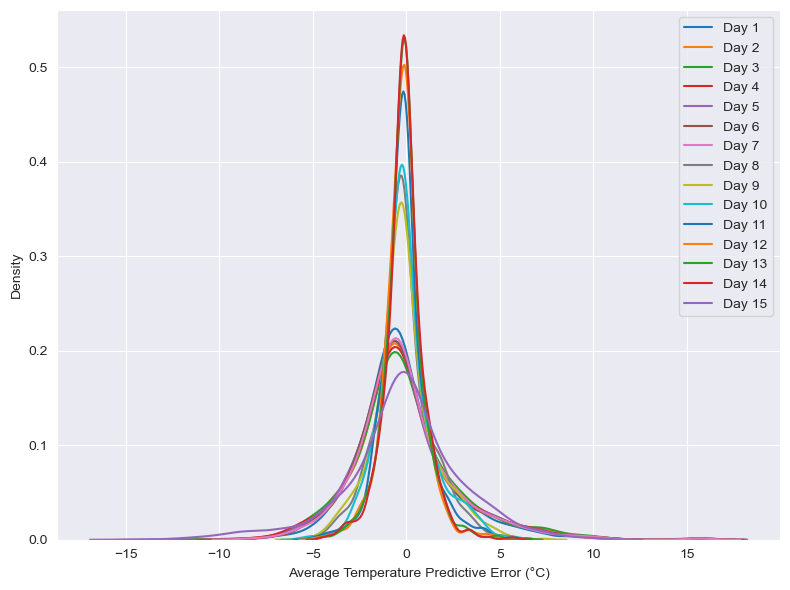

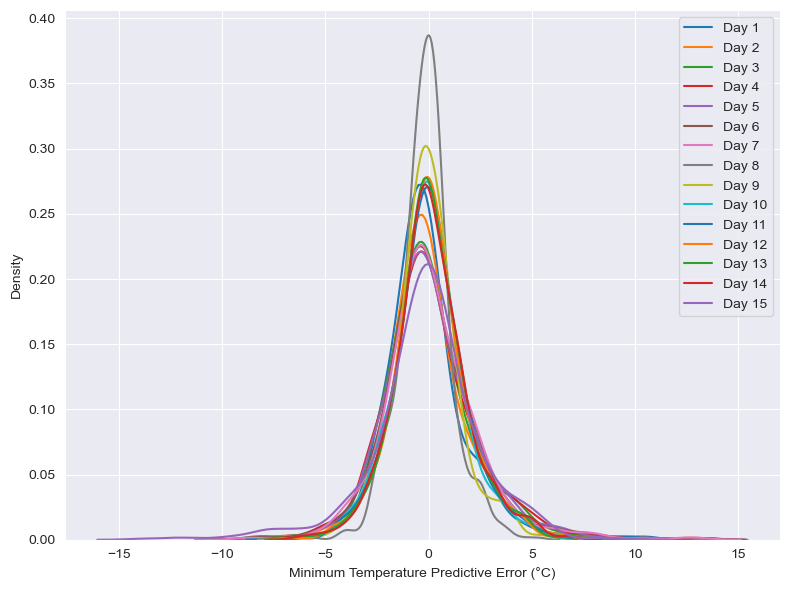

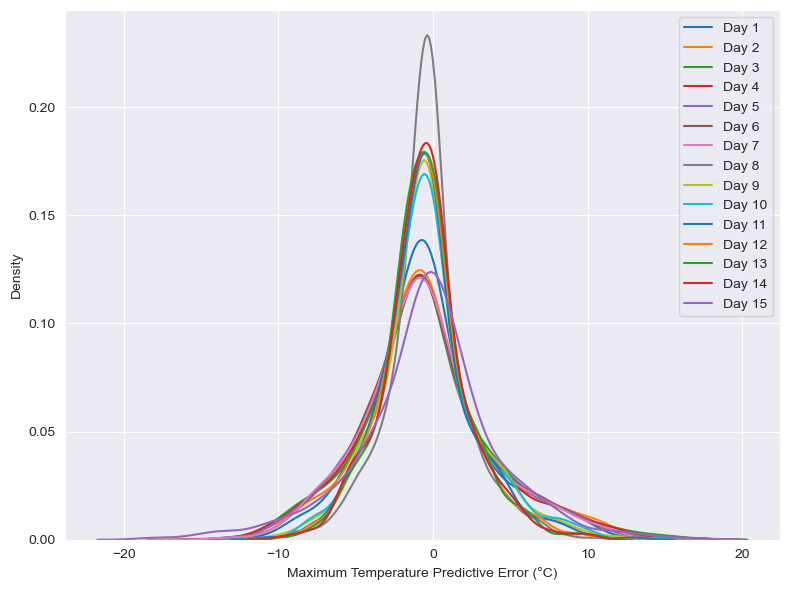

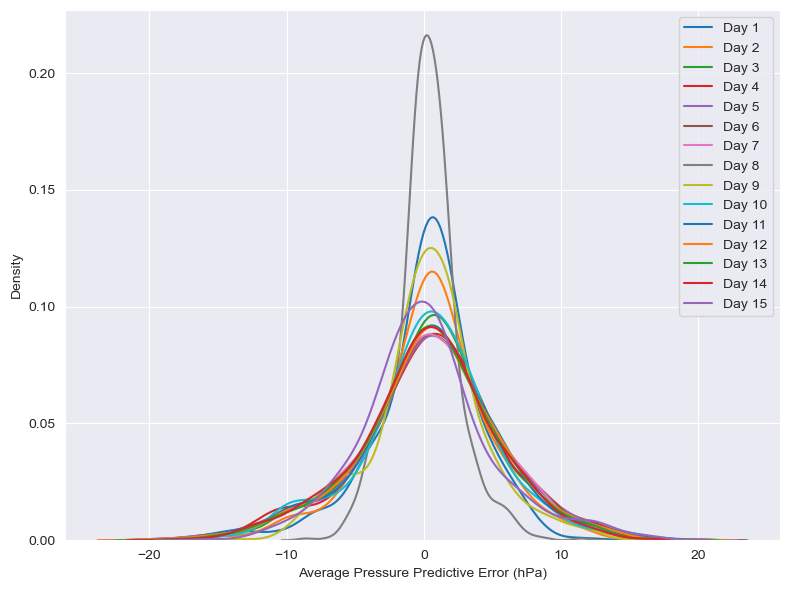

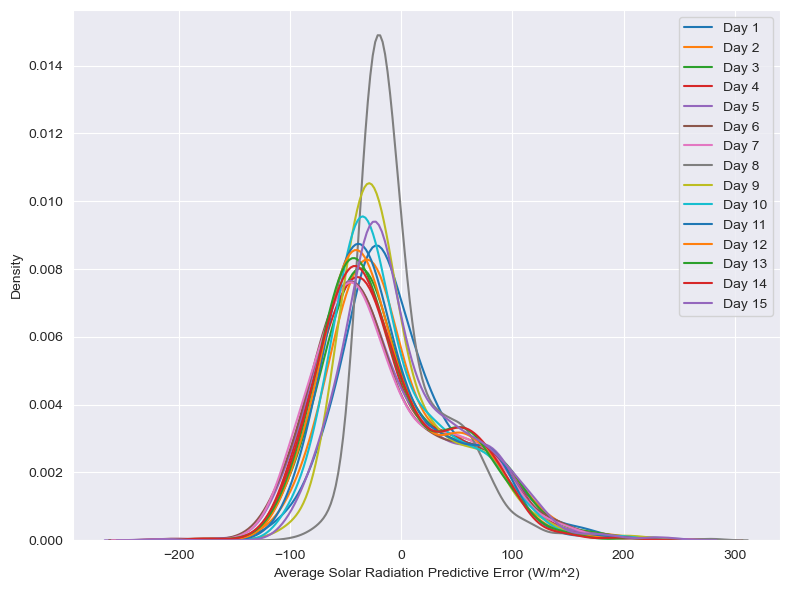

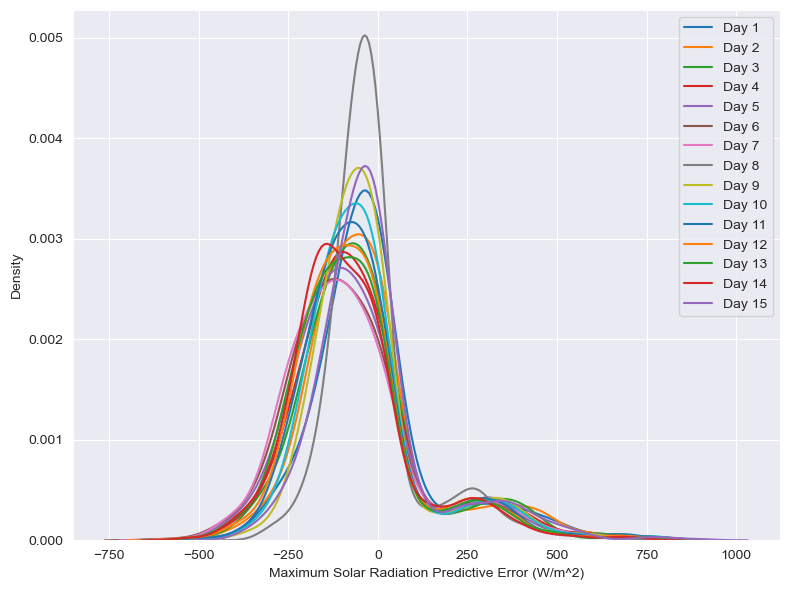

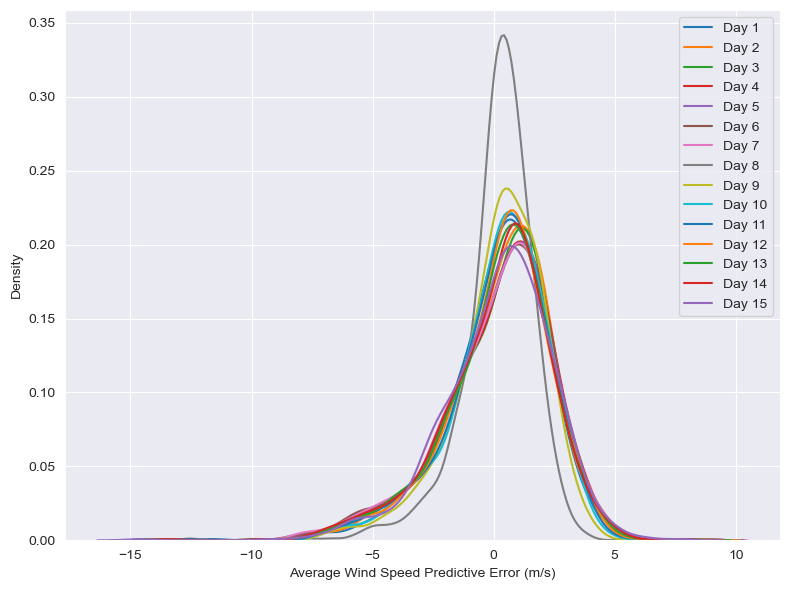

In [181]:
plot_error_density(rf_error, features, feature_title, feature_unit,'RF', N=win_size,save=True)

# GBM Model

In [182]:
# Check if file for model exists; otherwise, train the model
gbm_models_filename = f'cache/gbm_models_N={win_size}.joblib' # Filename of the model

if os.path.exists(gbm_models_filename):
    gbm_models = load(gbm_models_filename) # Load the model
    print("Model loaded from file.")
else:
    # Dictionary to store trained models for each weather variable
    gbm_models = {}

    # Train models
    for col in Y_train.columns:
        gbm = GradientBoostingRegressor(n_estimators=100, learning_rate=0.1, random_state=42)
        gbm.fit(X_train, Y_train[col])
        gbm_models[col] = gbm

    dump(gbm_models, gbm_models_filename) # Dump the model

gbm_models

Model loaded from file.


{'Temp_mean': GradientBoostingRegressor(random_state=42),
 'Temp_min': GradientBoostingRegressor(random_state=42),
 'Temp_max': GradientBoostingRegressor(random_state=42),
 'PresBarometr_mean': GradientBoostingRegressor(random_state=42),
 'RadSolar_mean': GradientBoostingRegressor(random_state=42),
 'RadSolar_max': GradientBoostingRegressor(random_state=42),
 'RapViento_mean': GradientBoostingRegressor(random_state=42)}

In [183]:
# Check if file for predicted dataframe exists; otherwise, compute it
gbm_predicted_filename = f'cache/gbm_predicted_N={win_size}.joblib' # Filename of the dataframe

if os.path.exists(gbm_predicted_filename):
    gbm_predicted = load(gbm_predicted_filename) # Load the dataframe 
    print("Dataframe loaded from file.")
else:
    # Predict weather variables for up to N days ahead using trained models
    gbm_predicted = iterative_prediction(gbm_models, X_val, Y_val, N=win_size)
    dump(gbm_predicted, gbm_predicted_filename) # Dump the dataframe

Dataframe loaded from file.


In [184]:
gbm_error = calculate_residuals(Y_val, gbm_predicted)

In [185]:
gbm_mae = gbm_error.abs().mean()
gbm_mae

Temp_mean_ahead1          1.786785
Temp_mean_ahead2          2.008903
Temp_mean_ahead3          2.025236
Temp_mean_ahead4          1.992030
Temp_mean_ahead5          1.937527
                            ...   
RapViento_mean_ahead11    1.621635
RapViento_mean_ahead12    1.669592
RapViento_mean_ahead13    1.708012
RapViento_mean_ahead14    1.713154
RapViento_mean_ahead15    1.745691
Length: 105, dtype: float64

Saved: results/N=15/GBM/Error Density/GBM_Error Density_Temp_mean_N=15.svg
Saved: results/N=15/GBM/Error Density/GBM_Error Density_Temp_min_N=15.svg
Saved: results/N=15/GBM/Error Density/GBM_Error Density_Temp_max_N=15.svg
Saved: results/N=15/GBM/Error Density/GBM_Error Density_PresBarometr_mean_N=15.svg
Saved: results/N=15/GBM/Error Density/GBM_Error Density_RadSolar_mean_N=15.svg
Saved: results/N=15/GBM/Error Density/GBM_Error Density_RadSolar_max_N=15.svg
Saved: results/N=15/GBM/Error Density/GBM_Error Density_RapViento_mean_N=15.svg


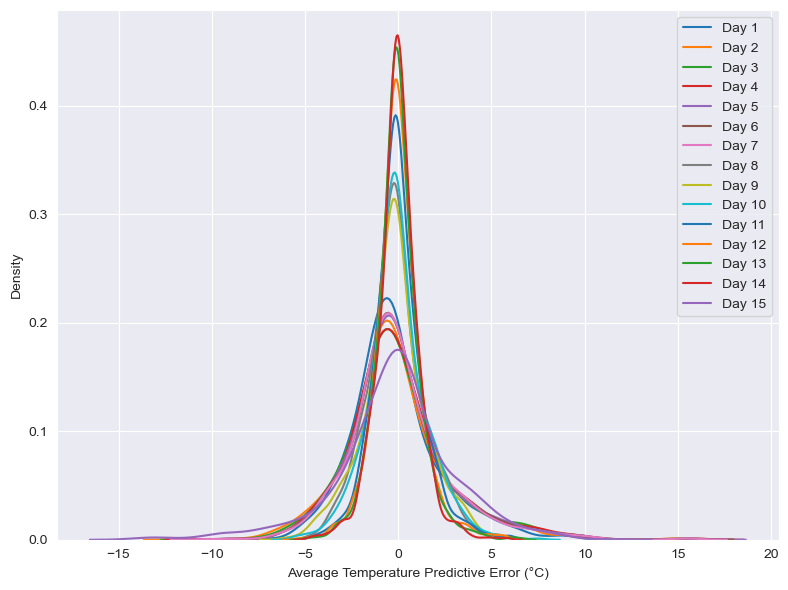

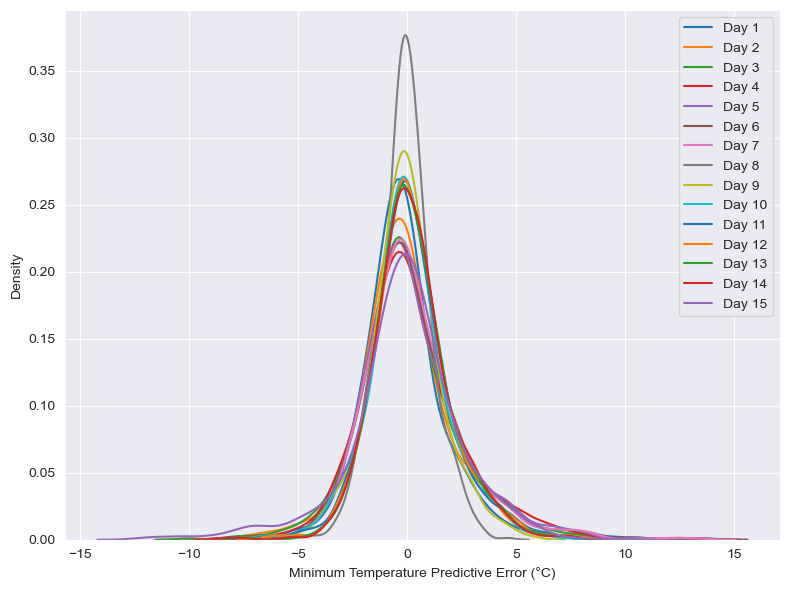

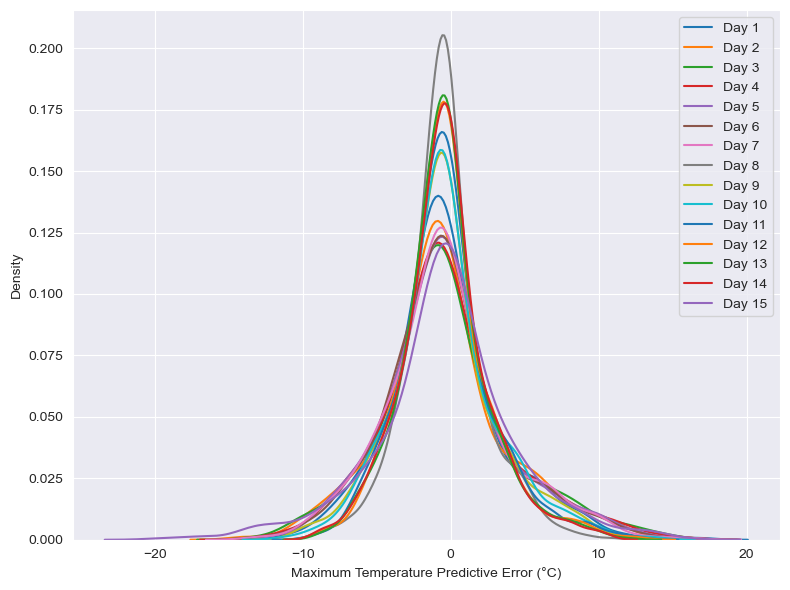

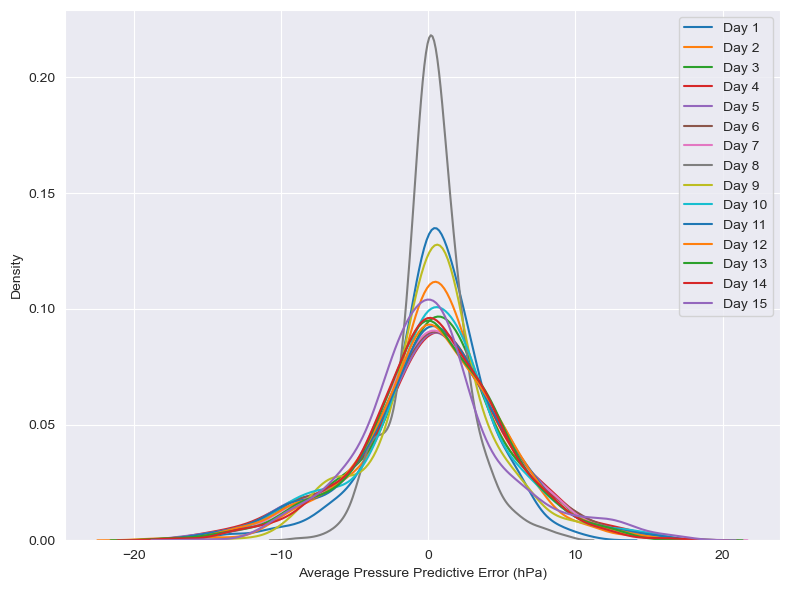

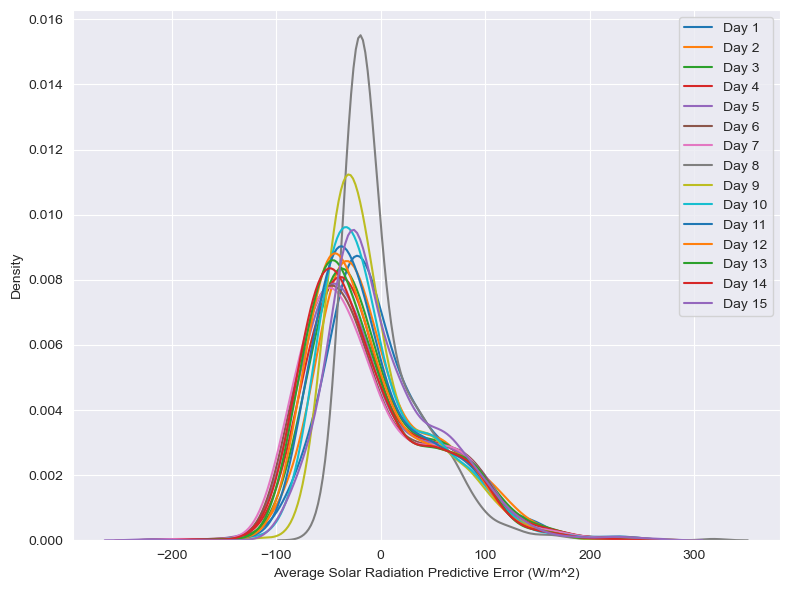

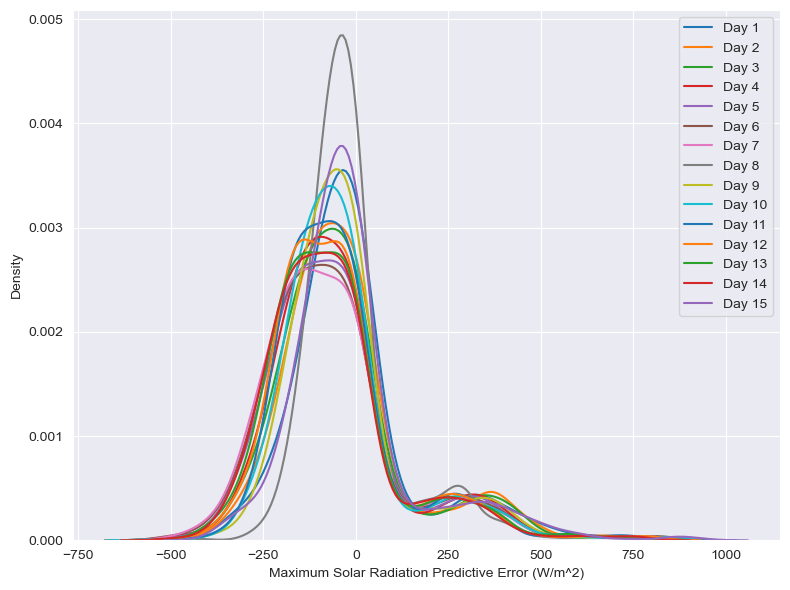

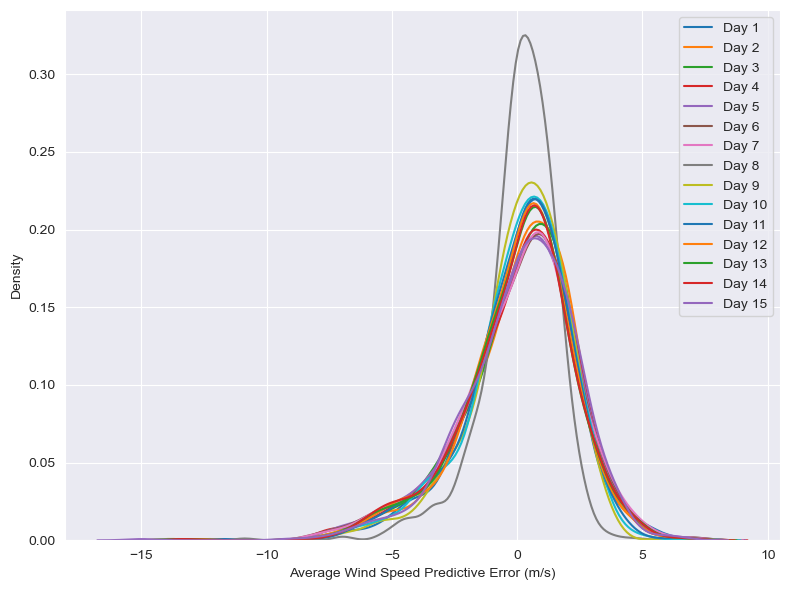

In [186]:
plot_error_density(gbm_error, features, feature_title, feature_unit,'GBM', N=win_size,save=True)

# SVM Model

In [187]:
# Check if file for model exists; otherwise, train the model
svm_models_filename = f'cache/svm_models_N={win_size}.joblib' # Filename of the model

if os.path.exists(svm_models_filename):
    svm_models = load(svm_models_filename) # Load the model
    print("Model loaded from file.")
else:
    # Dictionary to store trained models for each weather variable
    svm_models = {}

    # Train models
    for col in Y_train.columns:
        svm = SVR(kernel='rbf', C=1.0)
        svm.fit(X_train, Y_train[col])
        svm_models[col] = svm

    dump(svm_models, svm_models_filename) # Dump the model

svm_models

Model loaded from file.


{'Temp_mean': SVR(),
 'Temp_min': SVR(),
 'Temp_max': SVR(),
 'PresBarometr_mean': SVR(),
 'RadSolar_mean': SVR(),
 'RadSolar_max': SVR(),
 'RapViento_mean': SVR()}

In [188]:
# Check if file for predicted dataframe exists; otherwise, compute it
svm_predicted_filename = f'cache/svm_predicted_N={win_size}.joblib' # Filename of the dataframe

if os.path.exists(svm_predicted_filename):
    svm_predicted = load(svm_predicted_filename) # Load the dataframe 
    print("Dataframe loaded from file.")
else:
    # Predict weather variables for up to N days ahead using trained models
    svm_predicted = iterative_prediction(svm_models,  X_val, Y_val, N=win_size)
    dump(svm_predicted, svm_predicted_filename) # Dump the dataframe

Dataframe loaded from file.


In [189]:
svm_error = calculate_residuals(Y_val, svm_predicted)

In [190]:
svm_mae = svm_error.abs().mean()
svm_mae

Temp_mean_ahead1          3.199638
Temp_mean_ahead2          3.424007
Temp_mean_ahead3          3.515594
Temp_mean_ahead4          3.553175
Temp_mean_ahead5          3.600208
                            ...   
RapViento_mean_ahead11    1.996185
RapViento_mean_ahead12    2.006776
RapViento_mean_ahead13    2.030671
RapViento_mean_ahead14    2.046317
RapViento_mean_ahead15    1.928327
Length: 105, dtype: float64

Saved: results/N=15/SVM/Error Density/SVM_Error Density_Temp_mean_N=15.svg
Saved: results/N=15/SVM/Error Density/SVM_Error Density_Temp_min_N=15.svg
Saved: results/N=15/SVM/Error Density/SVM_Error Density_Temp_max_N=15.svg
Saved: results/N=15/SVM/Error Density/SVM_Error Density_PresBarometr_mean_N=15.svg
Saved: results/N=15/SVM/Error Density/SVM_Error Density_RadSolar_mean_N=15.svg
Saved: results/N=15/SVM/Error Density/SVM_Error Density_RadSolar_max_N=15.svg
Saved: results/N=15/SVM/Error Density/SVM_Error Density_RapViento_mean_N=15.svg


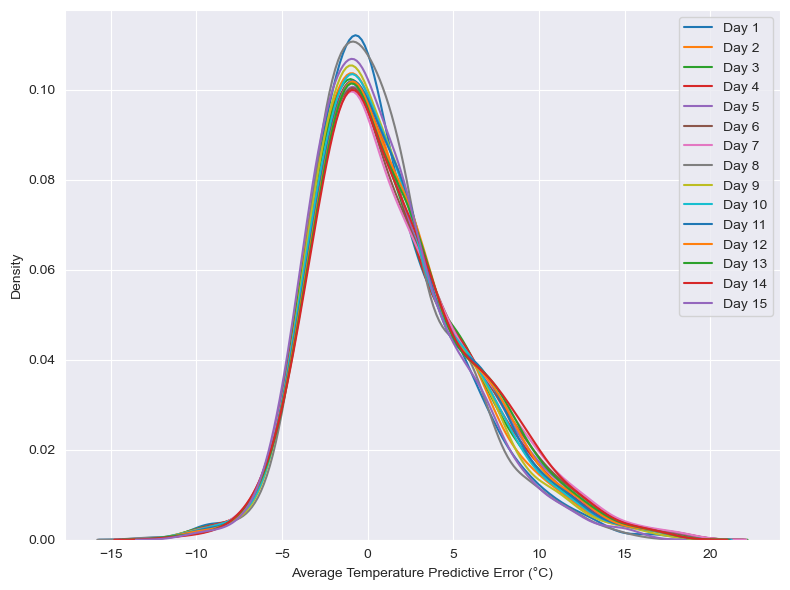

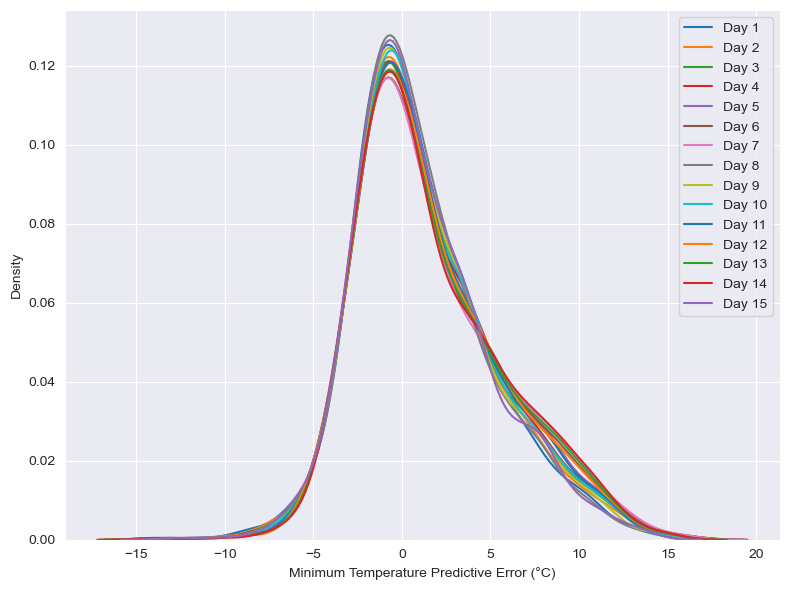

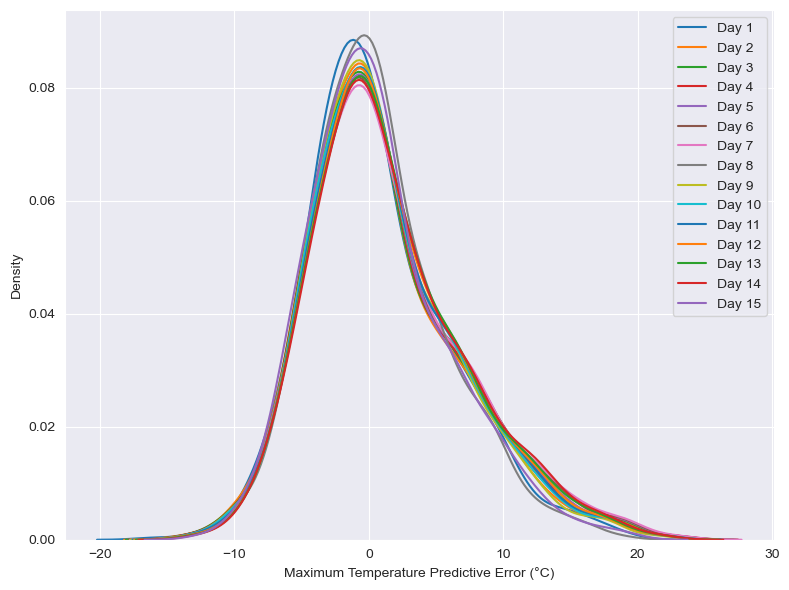

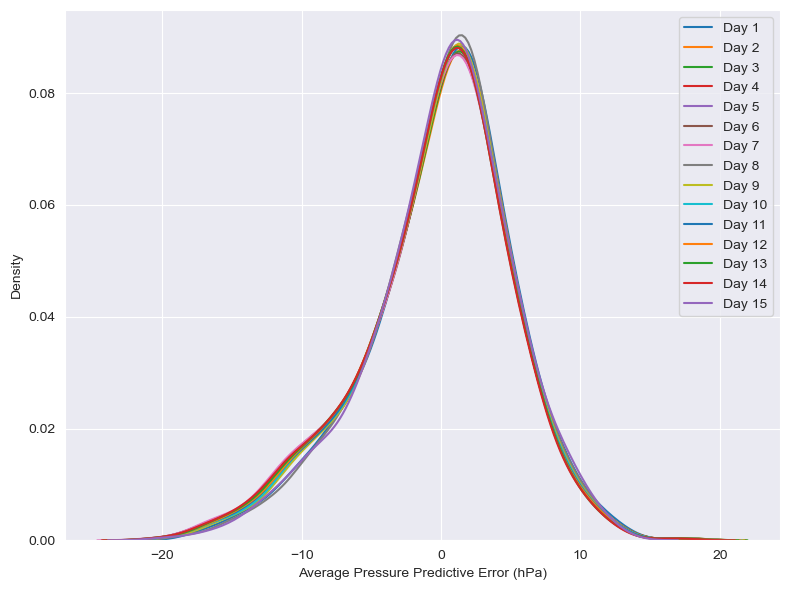

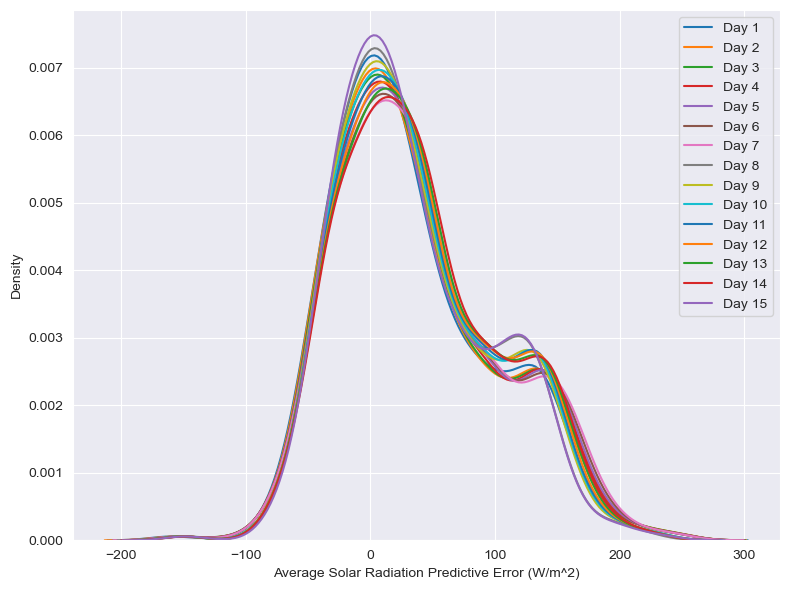

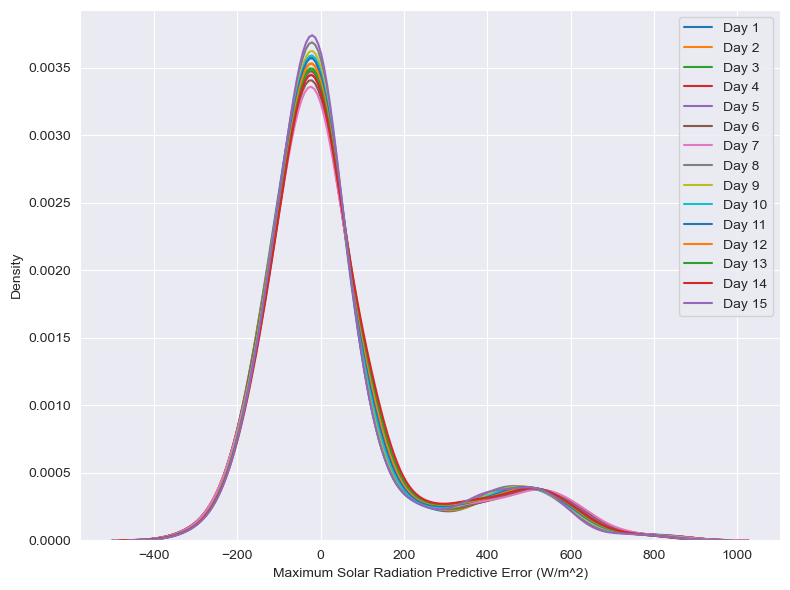

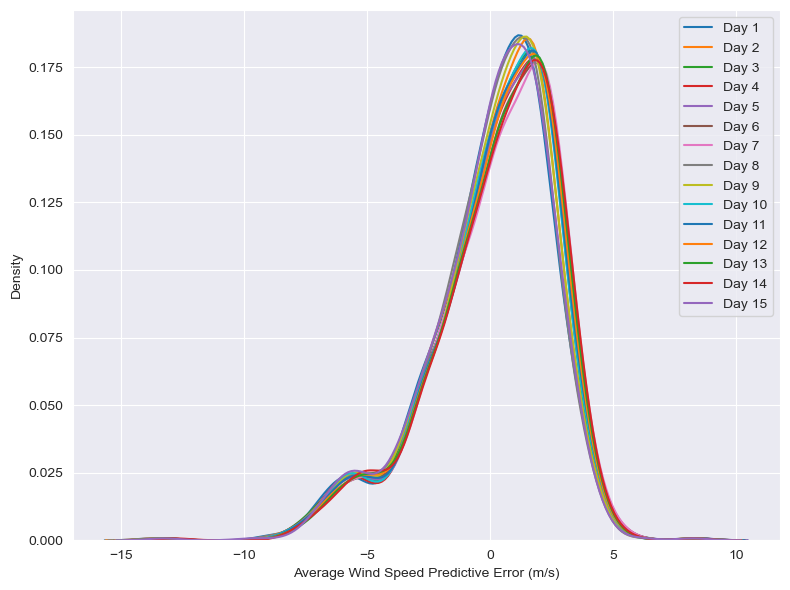

In [191]:
plot_error_density(svm_error, features, feature_title, feature_unit,'SVM', N=win_size,save=True)

# Comparative analysis

In [192]:
lstm_error = pd.read_csv(f'cache/LSTM_Residuals_N={win_size}.csv')
lstm_mae = lstm_error.abs().mean()

Saved: results/N=15/comparative/Comparative Error_Temp_mean_N=15.svg
Saved: results/N=15/comparative/Comparative Error_Temp_min_N=15.svg
Saved: results/N=15/comparative/Comparative Error_Temp_max_N=15.svg
Saved: results/N=15/comparative/Comparative Error_PresBarometr_mean_N=15.svg
Saved: results/N=15/comparative/Comparative Error_RadSolar_mean_N=15.svg
Saved: results/N=15/comparative/Comparative Error_RadSolar_max_N=15.svg
Saved: results/N=15/comparative/Comparative Error_RapViento_mean_N=15.svg


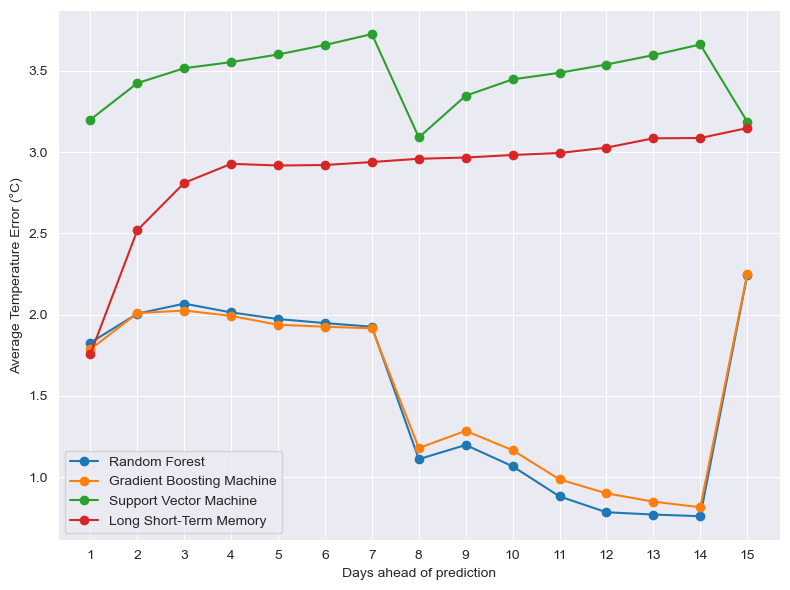

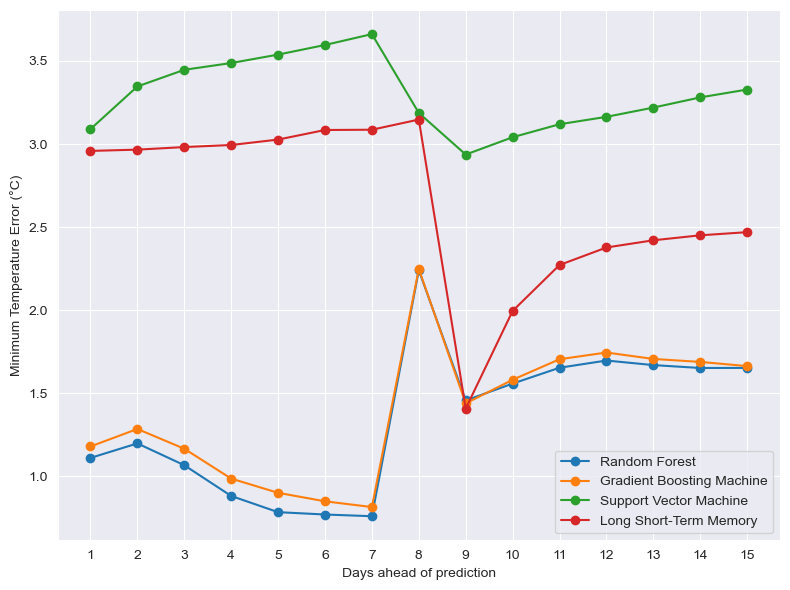

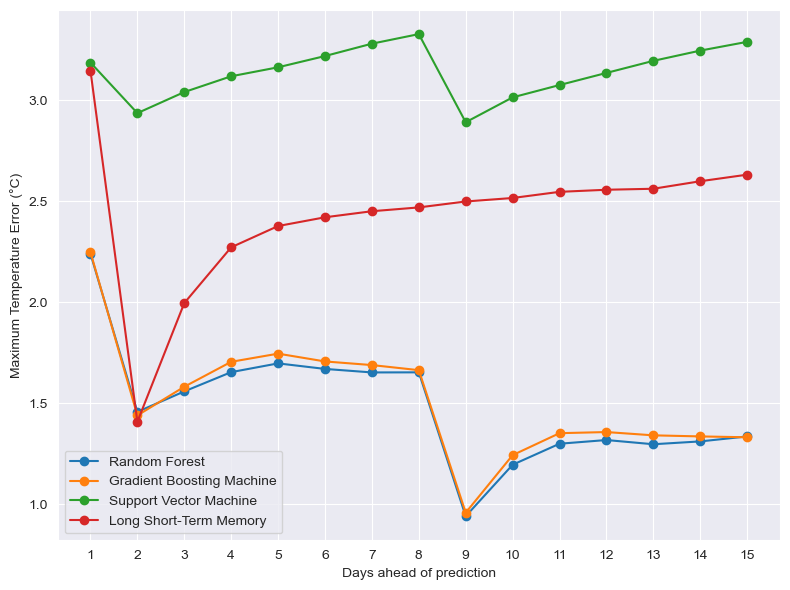

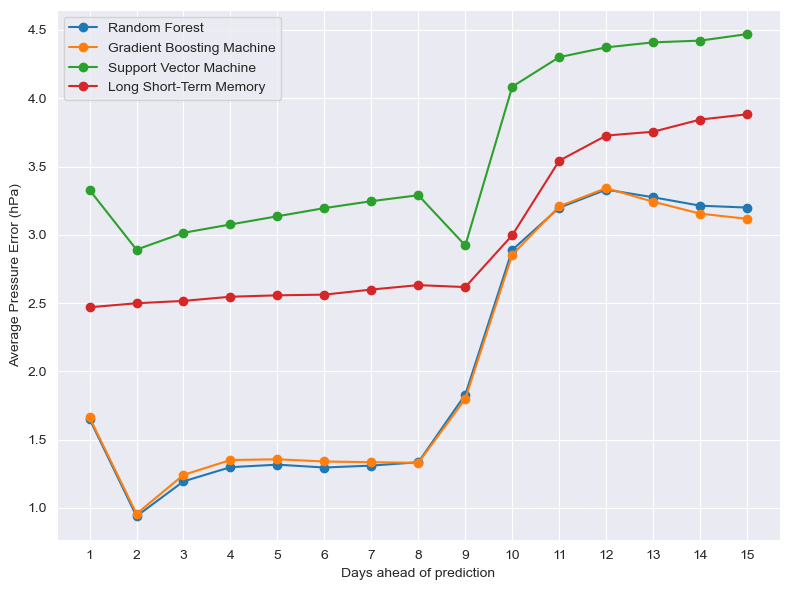

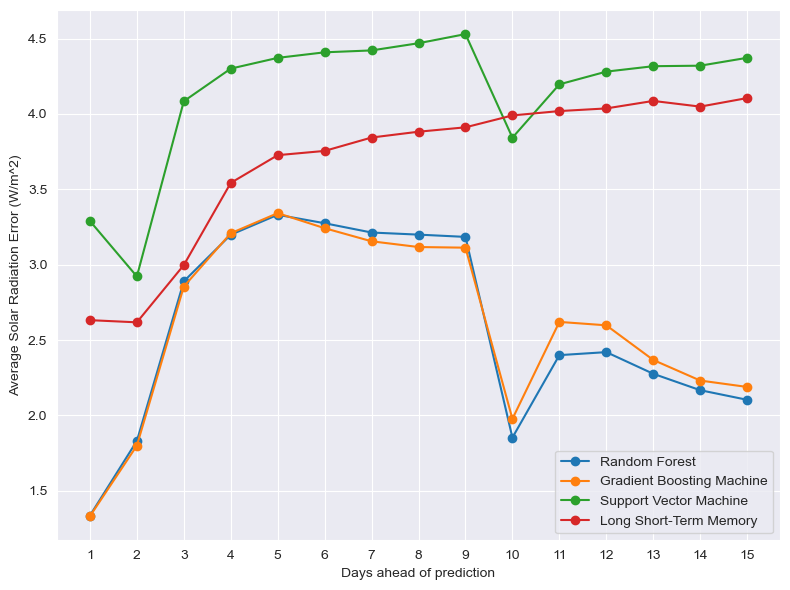

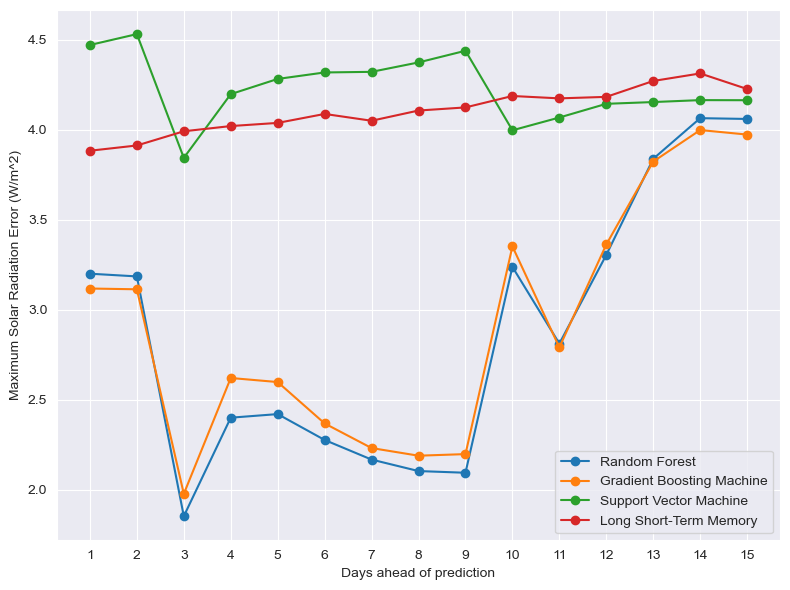

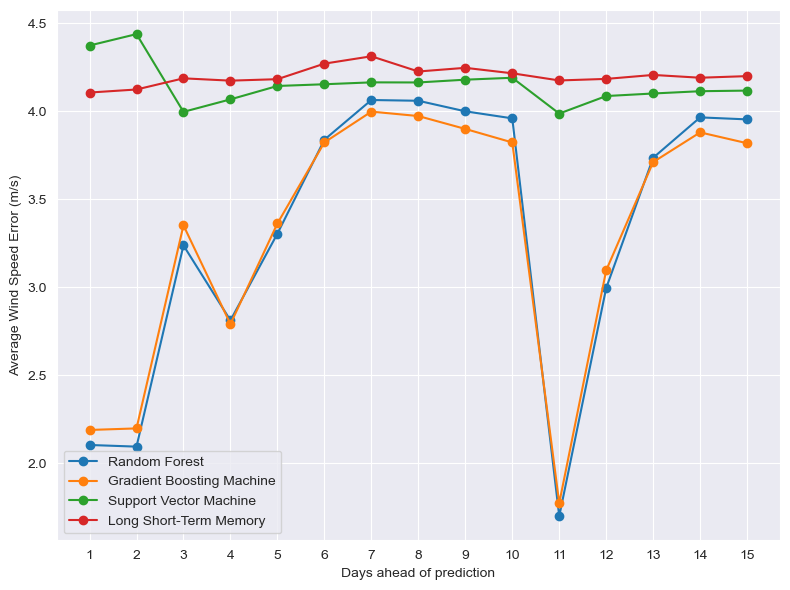

In [193]:
# Reshape the series
model1 = pd.DataFrame([rf_mae.values[i:i+win_size] for i in range(0, len(rf_mae), len(features))], columns=[f"{i+1}" for i in range(win_size)])
model2 = pd.DataFrame([gbm_mae.values[i:i+win_size] for i in range(0, len(gbm_mae), len(features))], columns=[f"{i+1}" for i in range(win_size)])
model3 = pd.DataFrame([svm_mae.values[i:i+win_size] for i in range(0, len(svm_mae), len(features))], columns=[f"{i+1}" for i in range(win_size)])
model4 = pd.DataFrame([lstm_mae.values[i:i+win_size] for i in range(0, len(lstm_mae), len(features))], columns=[f"{i+1}" for i in range(win_size)])

# Plot the error for each variable
for i in range(len(features)):
    if not os.path.exists(f'results/N={win_size}/comparative'):
        os.makedirs(f'results/N={win_size}/comparative')
    filename = f'results/N={win_size}/comparative/Comparative Error_{features[i]}_N={win_size}.svg'

    plt.figure(figsize=(8, 6))
    plt.plot(model1.columns, model1.iloc[i], label='Random Forest', marker='o')
    plt.plot(model2.columns, model2.iloc[i], label='Gradient Boosting Machine', marker='o')
    plt.plot(model3.columns, model3.iloc[i], label='Support Vector Machine', marker='o')
    plt.plot(model4.columns, model4.iloc[i], label='Long Short-Term Memory', marker='o')
    plt.ylabel(f'{feature_title[i]} Error ({feature_unit[i]})')
    plt.xlabel('Days ahead of prediction')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.savefig(filename, format='svg')
    print(f"Saved: {filename}")

C:\Users\gusta\AppData\Local\Temp\ipykernel_7404\3733513794.py:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(8, 6))


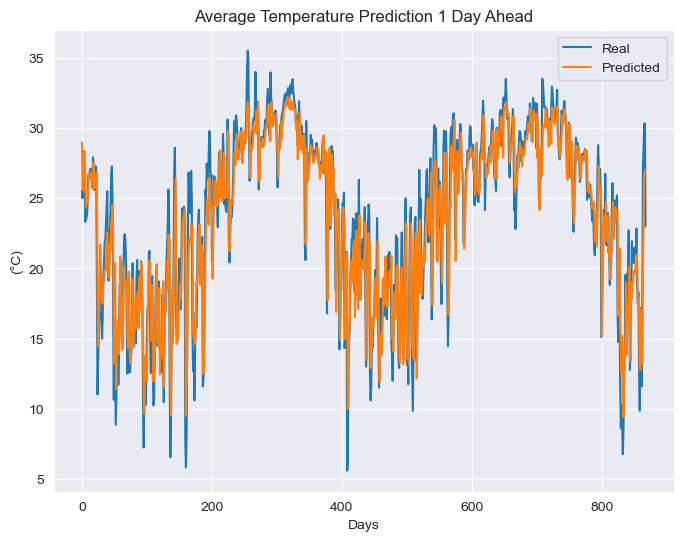

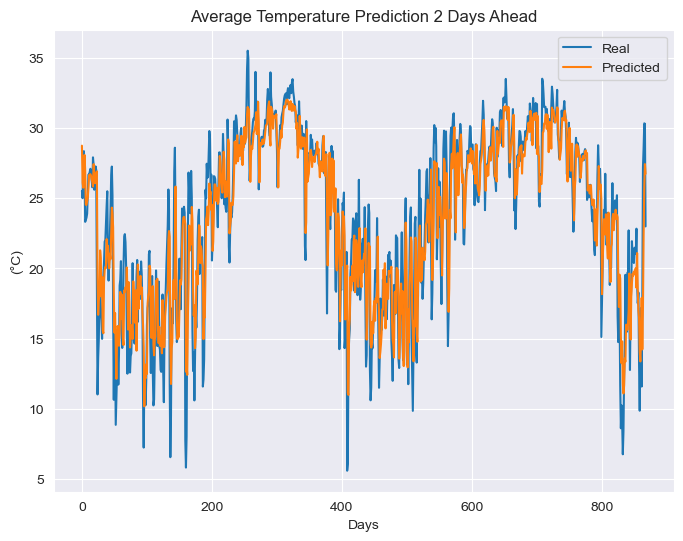

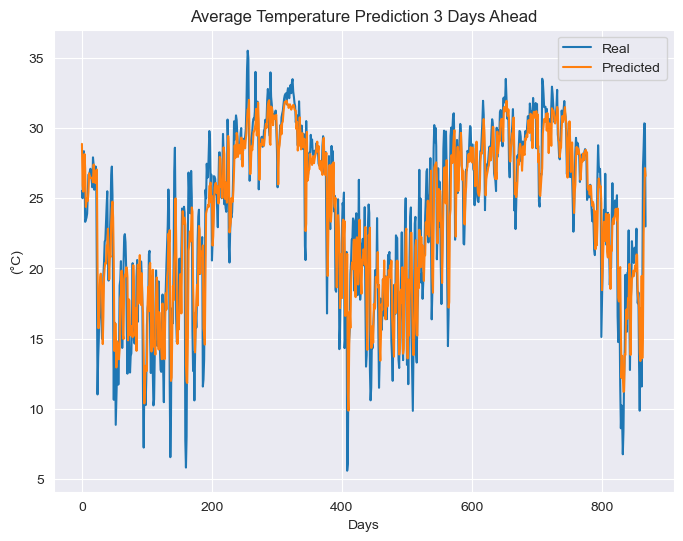

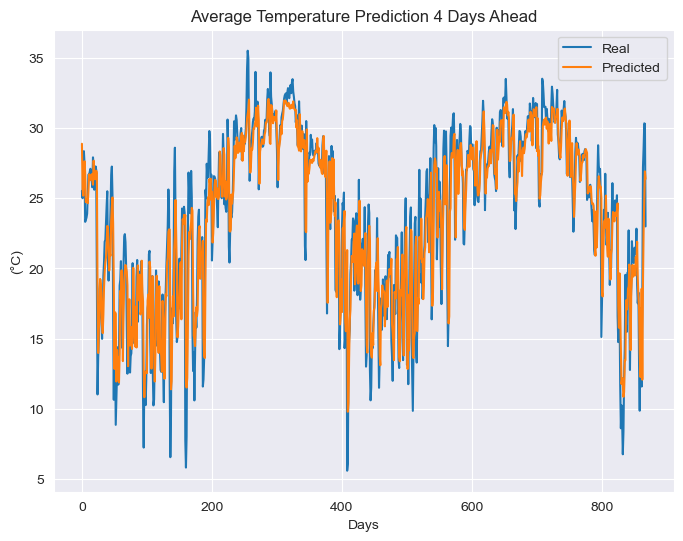

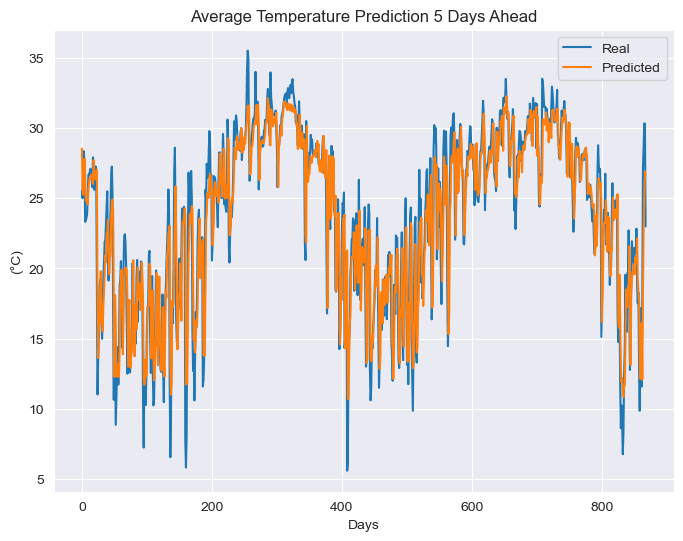

...

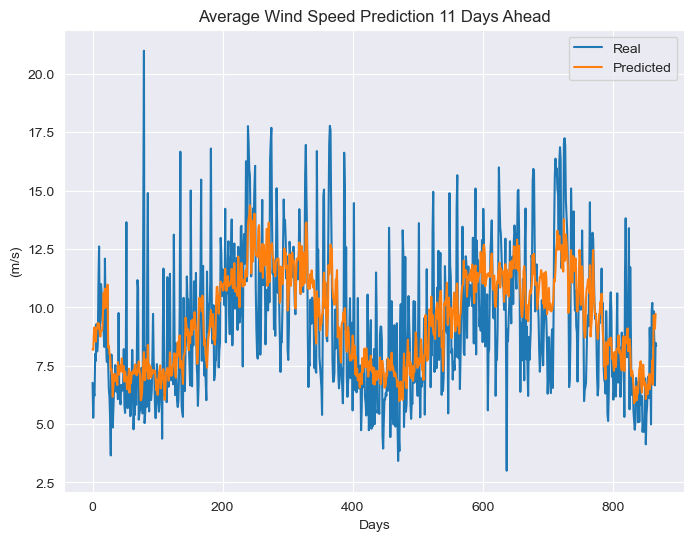

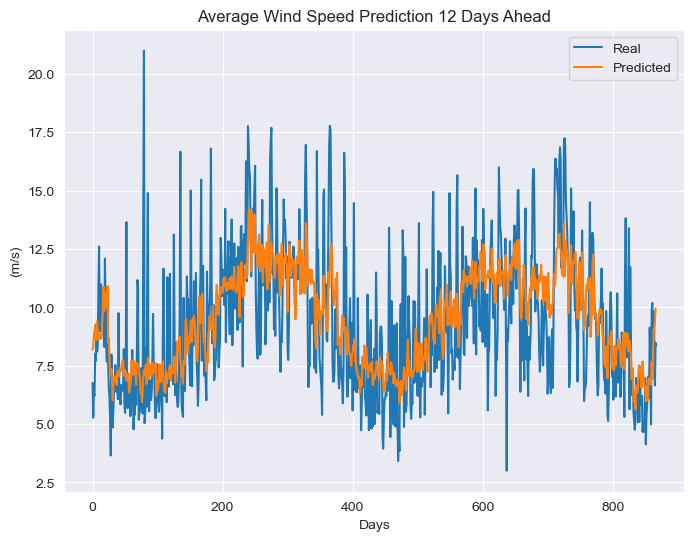

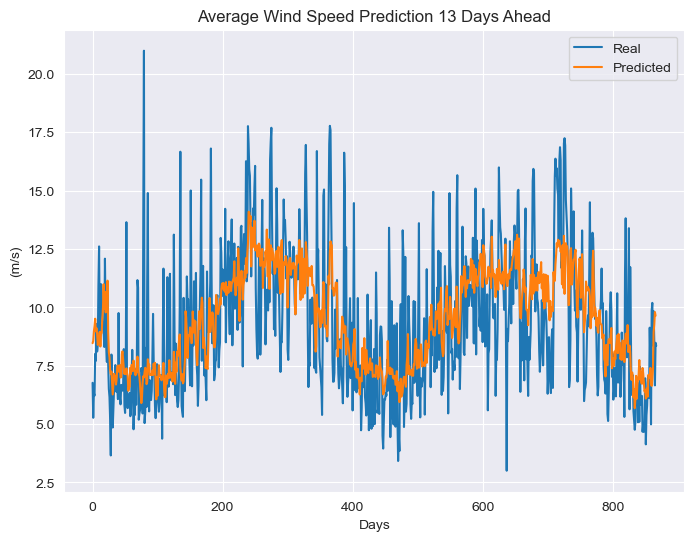

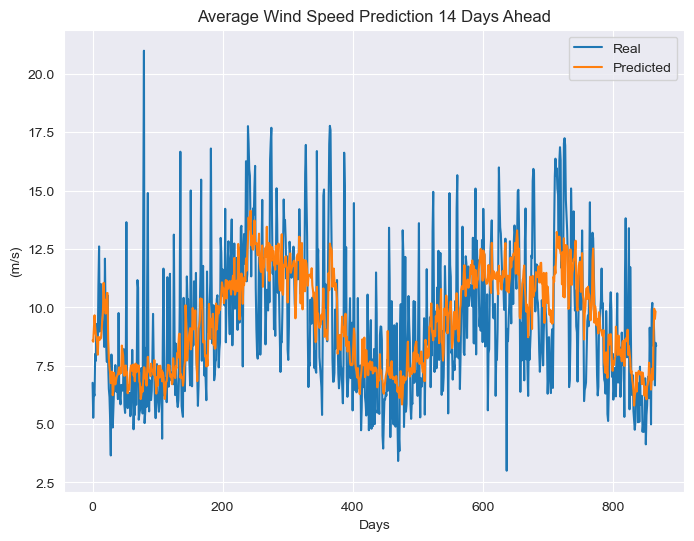

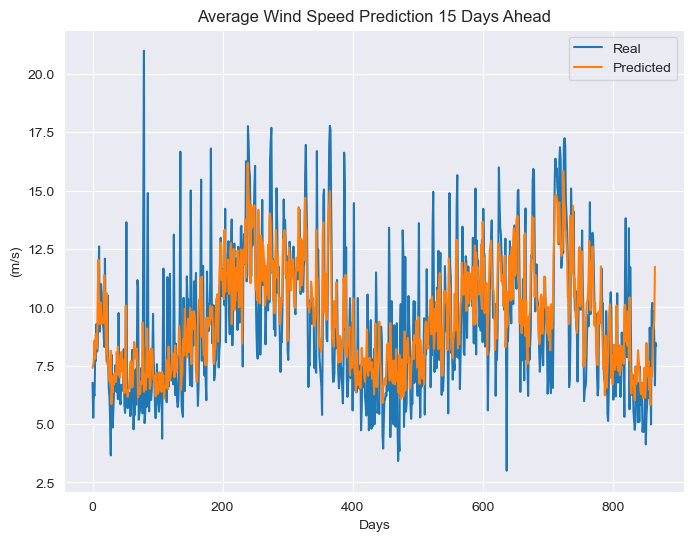

In [194]:
if not os.path.exists(f'results/N={win_size}/RF/VsVal'):
    os.makedirs(f'results/N={win_size}/RF/VsVal')

predicted_df = rf_predicted
    
for i in range(len(features)):
    real_col = Y_val.iloc[:, i]
    for j in range(win_size):
        predicted_col = predicted_df.iloc[:, i*win_size + j]
        plt.figure(figsize=(8, 6))
        plt.plot(real_col, label='Real')
        plt.plot(predicted_col, label='Predicted')
        if j == 0:
            plt.title(f'{feature_title[i]} Prediction {j+1} Day Ahead')
        else:
            plt.title(f'{feature_title[i]} Prediction {j+1} Days Ahead')
        plt.xlabel('Days')
        plt.ylabel(f'({feature_unit[i]})')
        plt.legend()
        plt.savefig(f'results/N={win_size}/RF/VsVal/{features[i]}_ahead{j}.svg', format='svg')

C:\Users\gusta\AppData\Local\Temp\ipykernel_7404\1865634993.py:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(8, 6))


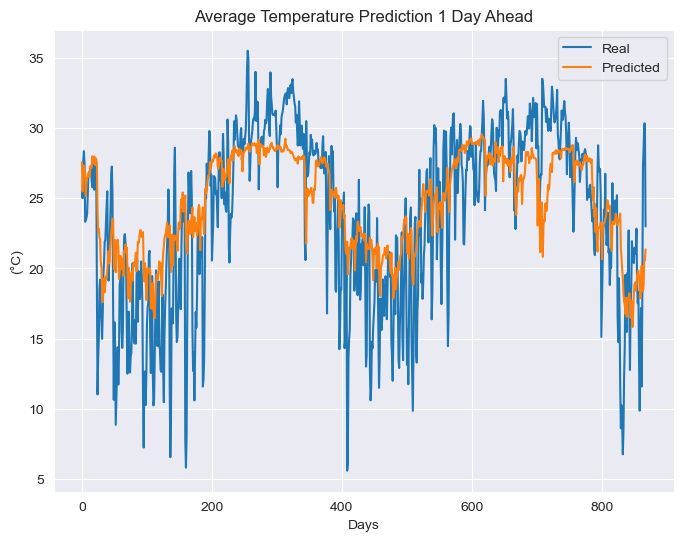

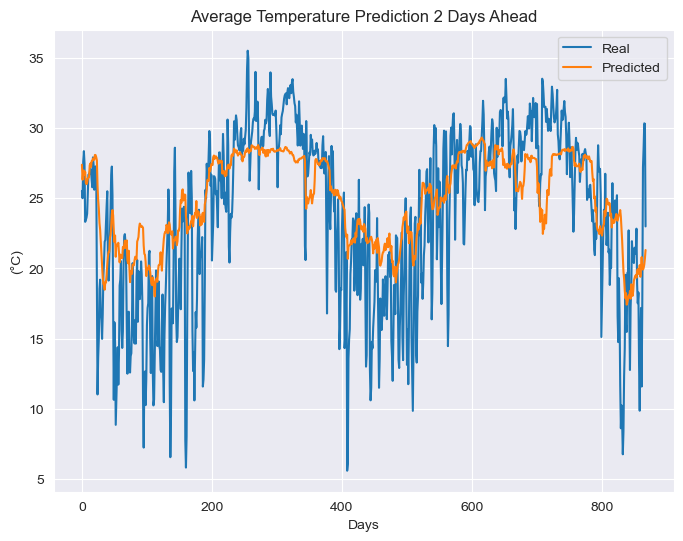

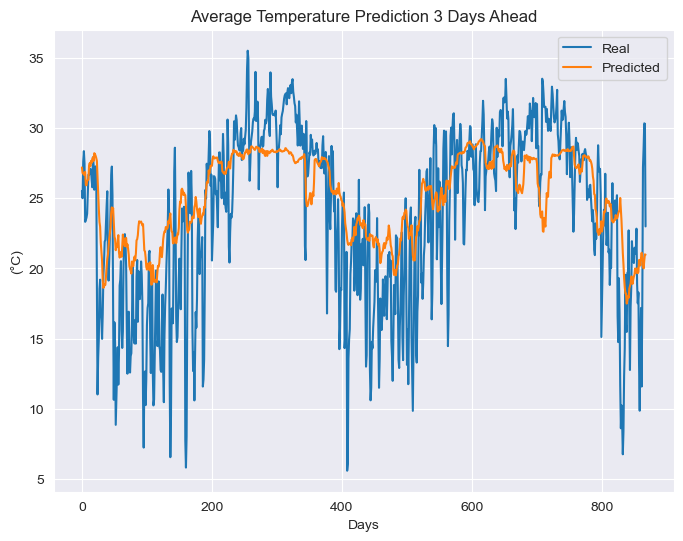

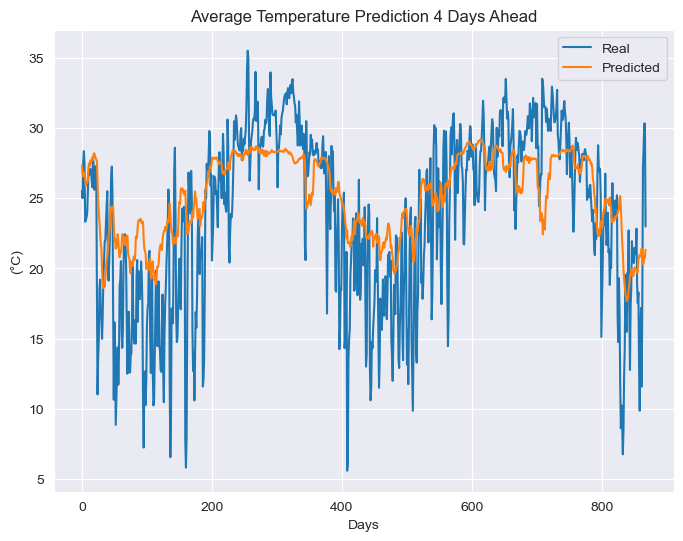

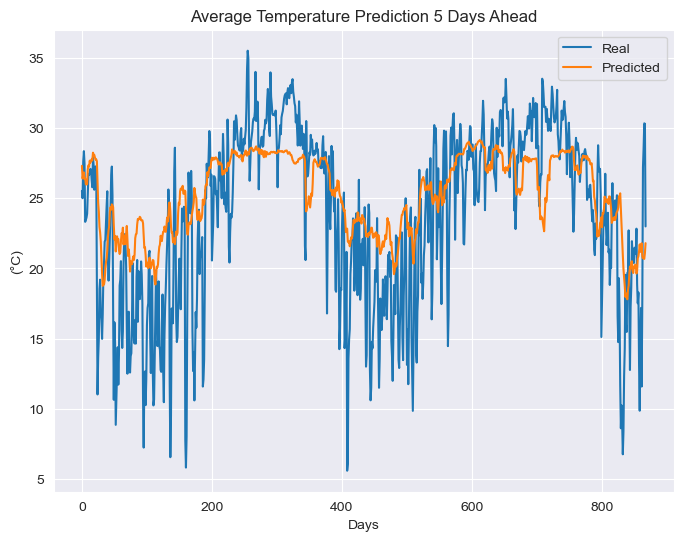

...

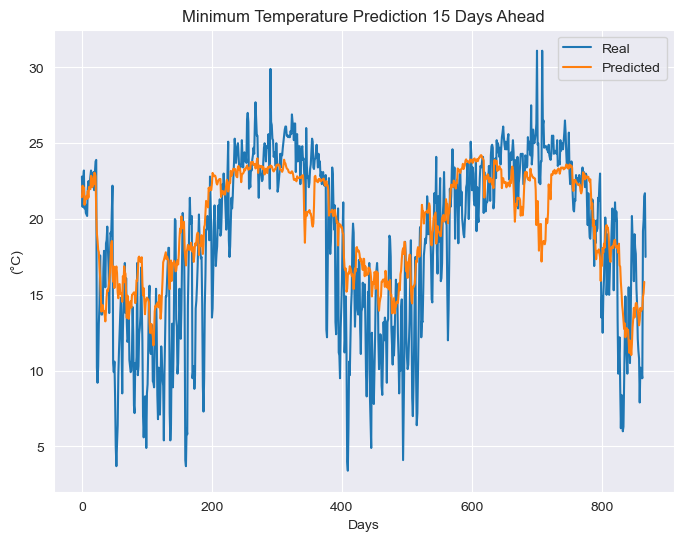

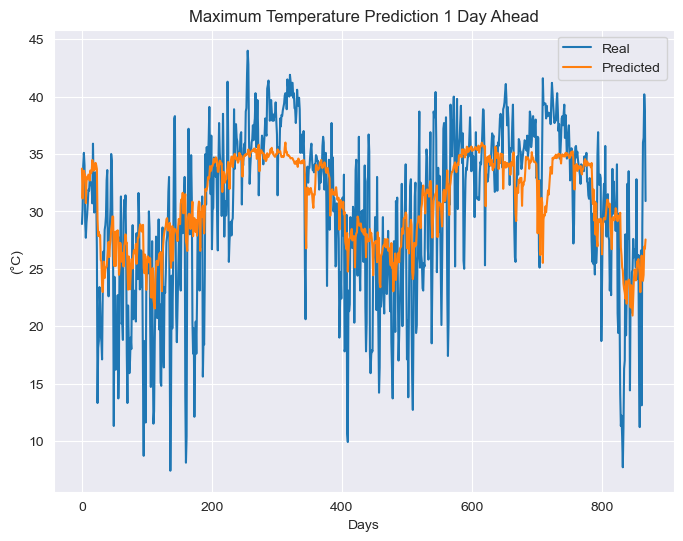

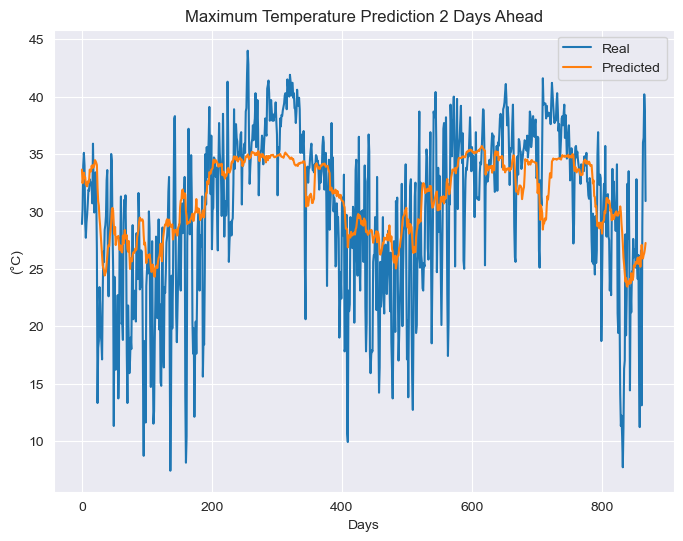

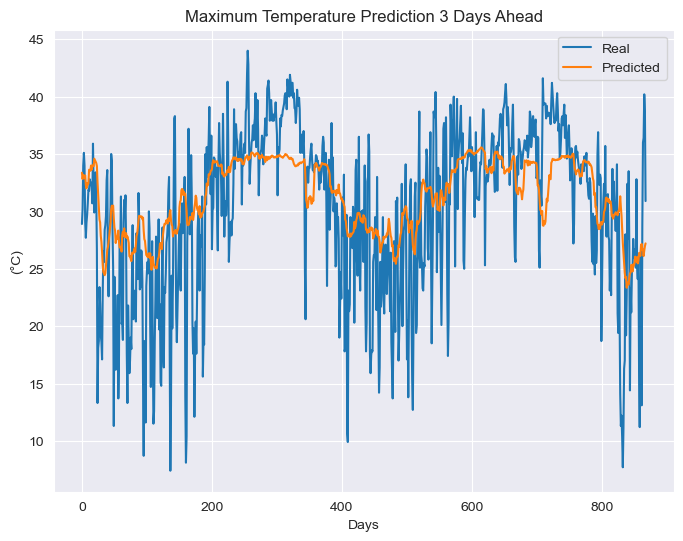

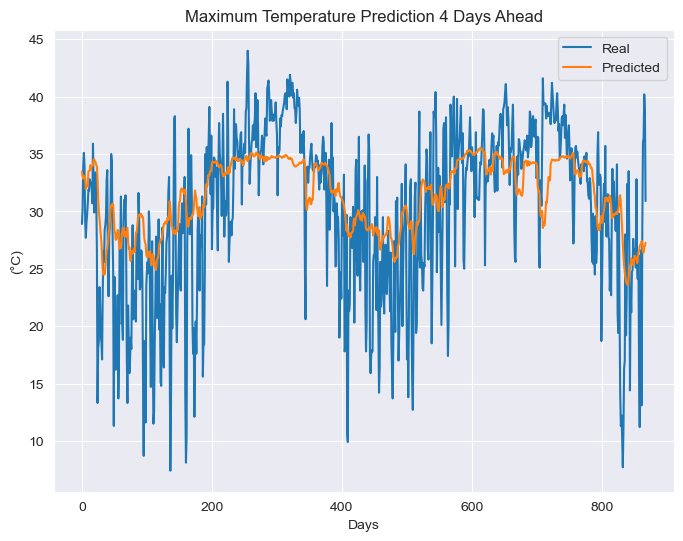

In [ ]:
if not os.path.exists(f'results/N={win_size}/SVM/VsVal'):
    os.makedirs(f'results/N={win_size}/SVM/VsVal')

predicted_df = svm_predicted

for i in range(len(features)):
    real_col = Y_val.iloc[:, i]
    for j in range(win_size):
        predicted_col = predicted_df.iloc[:, i*win_size + j]
        plt.figure(figsize=(8, 6))
        plt.plot(real_col, label='Real')
        plt.plot(predicted_col, label='Predicted')
        if j == 0:
            plt.title(f'{feature_title[i]} Prediction {j+1} Day Ahead')
        else:
            plt.title(f'{feature_title[i]} Prediction {j+1} Days Ahead')
        plt.xlabel('Days')
        plt.ylabel(f'({feature_unit[i]})')
        plt.legend()
        plt.savefig(f'results/N={win_size}/SVM/VsVal/{features[i]}_ahead{j}.svg', format='svg')

In [ ]:
if not os.path.exists(f'results/N={win_size}/GBM/VsVal'):
    os.makedirs(f'results/N={win_size}/GBM/VsVal')

predicted_df = gbm_predicted

for i in range(len(features)):
    real_col = Y_val.iloc[:, i]
    for j in range(win_size):
        predicted_col = predicted_df.iloc[:, i*win_size + j]
        plt.figure(figsize=(8, 6))
        plt.plot(real_col, label='Real')
        plt.plot(predicted_col, label='Predicted')
        if j == 0:
            plt.title(f'{feature_title[i]} Prediction {j+1} Day Ahead')
        else:
            plt.title(f'{feature_title[i]} Prediction {j+1} Days Ahead')
        plt.xlabel('Days')
        plt.ylabel(f'({feature_unit[i]})')
        plt.legend()
        plt.savefig(f'results/N={win_size}/GBM/VsVal/{features[i]}_ahead{j}.svg', format='svg')